<a href="https://colab.research.google.com/github/jebaliWafa/PRODIGY_DS_05/blob/main/TASK05.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

$$
\textbf{Traffic Accidents Analytics}
$$

![](https://jpdcfbh.ba/assets/photos/text/original/1495712579-sigurnost-prometa.jpg)

### Data Description

* **Accident_Index**: A unique identifier for each accident.
* **1st_Road_Class**: The classification of the first road involved in the accident (e.g., A road, B road).
* **1st_Road_Number**: The number of the first road involved in the accident.
* **2nd_Road_Class**: The classification of the second road involved in the accident, if applicable.
* **2nd_Road_Number**: The number of the second road involved in the accident, if applicable.
* **Accident_Severity**: The severity of the accident categorized as fatal, serious, or slight.
* **Carriageway_Hazards**: Any hazards present on the carriageway at the time of the accident (e.g., oil spill, debris).
* **Date**: The date on which the accident occurred.
* **Day_of_Week**: The day of the week on which the accident occurred.
* **Did_Police_Officer_Attend_Scene_of_Accident**: Indicates whether a police officer attended the scene of the accident.
* **Police_Force**: The police force area where the accident was reported.
* **Road_Surface_Conditions**: The condition of the road surface at the time of the accident (e.g., dry, wet).
* **Road_Type**: The type of road where the accident occurred (e.g., single carriageway, dual carriageway).
* **Special_Conditions_at_Site**: Any special conditions at the accident site (e.g., roadworks, road closure).
* **Speed_limit**: The speed limit of the road where the accident occurred.
* **Time**: The time at which the accident occurred.
* **Urban_or_Rural_Area**: Indicates whether the accident occurred in an urban or rural area.
* **Weather_Conditions**: The weather conditions at the time of the accident (e.g., clear, rainy).
* **Year**: The year in which the accident occurred.
* **InScotland**: Indicates whether the accident occurred in Scotland.







### Importing Libraries and dataset

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import pandas.plotting as pd_plotting
import scipy.stats as stats
import numpy as np
import seaborn as sns
import matplotlib.cm as cm
from sklearn.preprocessing import LabelEncoder
import folium
from folium.plugins import HeatMap
from scipy.stats import pearsonr
%matplotlib inline

In [ ]:
df=pd.read_csv("/content/sample_data/accident_data.csv")

### Preprocessing

In [ ]:
df.head()

,Accident_Index,1st_Road_Class,1st_Road_Number,2nd_Road_Class,2nd_Road_Number,Accident_Severity,Carriageway_Hazards,Date,Day_of_Week,Did_Police_Officer_Attend_Scene_of_Accident,...,Police_Force,Road_Surface_Conditions,Road_Type,Special_Conditions_at_Site,Speed_limit,Time,Urban_or_Rural_Area,Weather_Conditions,Year,InScotland
0,200501BS00001,A,3218,NaN,0.0,Serious,NaN,04/01/2005,Tuesday,1,...,Metropolitan Police,Wet or damp,Single carriageway,NaN,30.0,17:42,Urban,Raining no high winds,2005.0,No
1,200501BS00002,B,450,C,0.0,Slight,NaN,05/01/2005,Wednesday,1,...,Metropolitan Police,Dry,Dual carriageway,NaN,30.0,17:36,Urban,Fine no high winds,2005.0,No
2,200501BS00003,C,0,NaN,0.0,Slight,NaN,06/01/2005,Thursday,1,...,Metropolitan Police,Dry,Single carriageway,NaN,30.0,00:15,Urban,Fine no high winds,2005.0,No
3,200501BS00004,A,3220,NaN,0.0,Slight,NaN,07/01/2005,Friday,1,...,Metropolitan Police,Dry,Single carriageway,NaN,30.0,10:35,Urban,Fine no high winds,2005.0,No
4,200501BS00005,NaN,0,NaN,0.0,Slight,NaN,10/01/2005,Monday,1,...,Metropolitan Police,Wet or damp,Single carriageway,NaN,30.0,21:13,Urban,Fine no high winds,2005.0,No


In [ ]:
#Dataframe dimensions
df.shape

(21801, 34)

In [ ]:
#Dataframe info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21801 entries, 0 to 21800
Data columns (total 34 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Accident_Index                               21801 non-null  object 
 1   1st_Road_Class                               18183 non-null  object 
 2   1st_Road_Number                              21801 non-null  int64  
 3   2nd_Road_Class                               15319 non-null  object 
 4   2nd_Road_Number                              21799 non-null  float64
 5   Accident_Severity                            21801 non-null  object 
 6   Carriageway_Hazards                          117 non-null    object 
 7   Date                                         21801 non-null  object 
 8   Day_of_Week                                  21801 non-null  object 
 9   Did_Police_Officer_Attend_Scene_of_Accident  21801 non-null  int64  
 10

In [ ]:
#columns types
df.dtypes


Accident_Index                                  object
1st_Road_Class                                  object
1st_Road_Number                                  int64
2nd_Road_Class                                  object
2nd_Road_Number                                float64
Accident_Severity                               object
Carriageway_Hazards                             object
Date                                            object
Day_of_Week                                     object
Did_Police_Officer_Attend_Scene_of_Accident      int64
Junction_Control                                object
Junction_Detail                                 object
Latitude                                       float64
Light_Conditions                                object
Local_Authority_(District)                      object
Local_Authority_(Highway)                       object
Location_Easting_OSGR                          float64
Location_Northing_OSGR                         float64
Longitude 

In [ ]:
# Drop the columns
df=df.drop(columns=[
    'Accident_Index', '1st_Road_Class', '1st_Road_Number',
    '2nd_Road_Class', '2nd_Road_Number', 'Carriageway_Hazards',
     'Local_Authority_(Highway)',
    'Local_Authority_(District)', 'LSOA_of_Accident_Location',
    'Pedestrian_Crossing-Human_Control', 'Pedestrian_Crossing-Physical_Facilities','InScotland','Did_Police_Officer_Attend_Scene_of_Accident',
]
)

In [ ]:
#checking for missing values
df.isnull().sum()

Accident_Severity                 0
Date                              0
Day_of_Week                       0
Junction_Control                  0
Junction_Detail                   0
Latitude                          1
Light_Conditions               2085
Location_Easting_OSGR             1
Location_Northing_OSGR            1
Longitude                         1
Number_of_Casualties              1
Number_of_Vehicles                1
Police_Force                      1
Road_Surface_Conditions           3
Road_Type                        21
Special_Conditions_at_Site    21544
Speed_limit                       1
Time                              1
Urban_or_Rural_Area               1
Weather_Conditions               62
Year                              1
dtype: int64

In [ ]:
#replace categorical missing columns by mode and numerical missing columns by mean

# Filling missing values for categorical features with mode
categorical_cols = df.select_dtypes(include=['object']).columns
df[categorical_cols] = df[categorical_cols].fillna(df[categorical_cols].mode().iloc[0])

# Filling missing values for numerical features with mean
numerical_cols = df.select_dtypes(include=['float', 'int']).columns
df[numerical_cols] = df[numerical_cols].fillna(df[numerical_cols].mean())


In [ ]:
#Verifying if any remaining  missing values
df.isnull().sum()

Accident_Severity             0
Date                          0
Day_of_Week                   0
Junction_Control              0
Junction_Detail               0
Latitude                      0
Light_Conditions              0
Location_Easting_OSGR         0
Location_Northing_OSGR        0
Longitude                     0
Number_of_Casualties          0
Number_of_Vehicles            0
Police_Force                  0
Road_Surface_Conditions       0
Road_Type                     0
Special_Conditions_at_Site    0
Speed_limit                   0
Time                          0
Urban_or_Rural_Area           0
Weather_Conditions            0
Year                          0
dtype: int64

In [ ]:
#Checking for duplicated data
df.duplicated().sum()

0

In [ ]:
#Summary statistics for all columns
df.describe(include="all")

,Accident_Severity,Date,Day_of_Week,Junction_Control,Junction_Detail,Latitude,Light_Conditions,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,...,Number_of_Vehicles,Police_Force,Road_Surface_Conditions,Road_Type,Special_Conditions_at_Site,Speed_limit,Time,Urban_or_Rural_Area,Weather_Conditions,Year
count,21801,21801,21801,21801,21801,21801.000000,21801,21801.000000,21801.000000,21801.000000,...,21801.000000,21801,21801,21801,21801,21801.000000,21801,21801,21801,21801.0
unique,3,365,7,6,10,NaN,5,NaN,NaN,NaN,...,NaN,2,5,5,9,NaN,1370,2,8,NaN
top,Slight,17/03/2005,Friday,Give way or uncontrolled,T or staggered junction,NaN,Daylight,NaN,NaN,NaN,...,NaN,Metropolitan Police,Dry,Single carriageway,Roadworks,NaN,18:00,Urban,Fine no high winds,NaN
freq,18893,91,3435,10920,9199,NaN,15254,NaN,NaN,NaN,...,NaN,21490,17730,17337,21684,NaN,193,21428,19089,NaN
mean,NaN,NaN,NaN,NaN,NaN,51.508211,NaN,531673.526147,180528.399541,-0.104028,...,1.798257,NaN,NaN,NaN,NaN,31.079358,NaN,NaN,NaN,2005.0
std,NaN,NaN,NaN,NaN,NaN,0.059804,NaN,9880.851721,6672.389815,0.142545,...,0.653808,NaN,NaN,NaN,NaN,4.761768,NaN,NaN,NaN,0.0
min,NaN,NaN,NaN,NaN,NaN,51.292210,NaN,503870.000000,156800.000000,-0.505928,...,1.000000,NaN,NaN,NaN,NaN,20.000000,NaN,NaN,NaN,2005.0
25%,NaN,NaN,NaN,NaN,NaN,51.466179,NaN,525160.000000,175810.000000,-0.197548,...,1.000000,NaN,NaN,NaN,NaN,30.000000,NaN,NaN,NaN,2005.0
50%,NaN,NaN,NaN,NaN,NaN,51.511908,NaN,531040.000000,180950.000000,-0.113764,...,2.000000,NaN,NaN,NaN,NaN,30.000000,NaN,NaN,NaN,2005.0
75%,NaN,NaN,NaN,NaN,NaN,51.551499,NaN,538260.000000,185370.000000,-0.008851,...,2.000000,NaN,NaN,NaN,NaN,30.000000,NaN,NaN,NaN,2005.0


In [ ]:
#identifying the categorical variables
print(f'Categorical variables: {categorical_cols.tolist()}')

Categorical variables: ['Accident_Severity', 'Date', 'Day_of_Week', 'Junction_Control', 'Junction_Detail', 'Light_Conditions', 'Police_Force', 'Road_Surface_Conditions', 'Road_Type', 'Special_Conditions_at_Site', 'Time', 'Urban_or_Rural_Area', 'Weather_Conditions']


In [ ]:
# Identifying the numerical variables (both float64 and int64)
print(f'Numerical variables: {numerical_cols.tolist()}')

Numerical variables: ['Latitude', 'Location_Easting_OSGR', 'Location_Northing_OSGR', 'Longitude', 'Number_of_Casualties', 'Number_of_Vehicles', 'Speed_limit', 'Year']


In [ ]:
df.head()

,Accident_Severity,Date,Day_of_Week,Junction_Control,Junction_Detail,Latitude,Light_Conditions,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,...,Number_of_Vehicles,Police_Force,Road_Surface_Conditions,Road_Type,Special_Conditions_at_Site,Speed_limit,Time,Urban_or_Rural_Area,Weather_Conditions,Year
0,Serious,04/01/2005,Tuesday,Data missing or out of range,Not at junction or within 20 metres,51.489096,Daylight,525680.0,178240.0,-0.191170,...,1.0,Metropolitan Police,Wet or damp,Single carriageway,Roadworks,30.0,17:42,Urban,Raining no high winds,2005.0
1,Slight,05/01/2005,Wednesday,Auto traffic signal,Crossroads,51.520075,Darkness - lights lit,524170.0,181650.0,-0.211708,...,1.0,Metropolitan Police,Dry,Dual carriageway,Roadworks,30.0,17:36,Urban,Fine no high winds,2005.0
2,Slight,06/01/2005,Thursday,Data missing or out of range,Not at junction or within 20 metres,51.525301,Darkness - lights lit,524520.0,182240.0,-0.206458,...,2.0,Metropolitan Police,Dry,Single carriageway,Roadworks,30.0,00:15,Urban,Fine no high winds,2005.0
3,Slight,07/01/2005,Friday,Data missing or out of range,Not at junction or within 20 metres,51.482442,Daylight,526900.0,177530.0,-0.173862,...,1.0,Metropolitan Police,Dry,Single carriageway,Roadworks,30.0,10:35,Urban,Fine no high winds,2005.0
4,Slight,10/01/2005,Monday,Data missing or out of range,Not at junction or within 20 metres,51.495752,Darkness - lighting unknown,528060.0,179040.0,-0.156618,...,1.0,Metropolitan Police,Wet or damp,Single carriageway,Roadworks,30.0,21:13,Urban,Fine no high winds,2005.0


In [ ]:
#Data Engineering

# Convert the 'Time' and 'Date' to datetime
df['Time'] = pd.to_datetime(df['Time'],format='%H:%M')

df['Date'] = pd.to_datetime(df['Date'],dayfirst=True)

# Extract the Hour from Time
df['Hour'] = df['Time'].dt.hour

#Extract Month from Date
df['Month'] = df['Date'].dt.month

#Extract Season using Month
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Autumn'

df['Season'] = df['Month'].apply(get_season)


In [ ]:
# Ensure 'Day_of_Week' & 'Season' are treated as a categorical variables with a specified order
df['Day_of_Week'] = pd.Categorical(df['Day_of_Week'],
                                   categories=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
                                   ordered=True)

df['Season'] = pd.Categorical(df['Season'], categories=['Winter', 'Spring', 'Summer', 'Autumn'], ordered=True)

### EDA & Pattern Identification

#### Temporal Analysis

##### Time

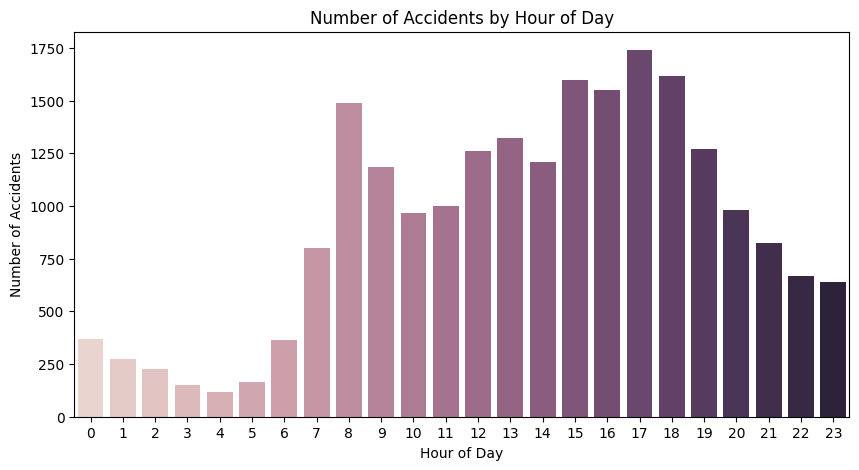

In [ ]:

# Plot accidents by hour
plt.figure(figsize=(10, 5))
sns.countplot(x='Hour', data=df, hue='Hour',legend=False)
plt.title('Number of Accidents by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Accidents')
plt.show()

##### Date

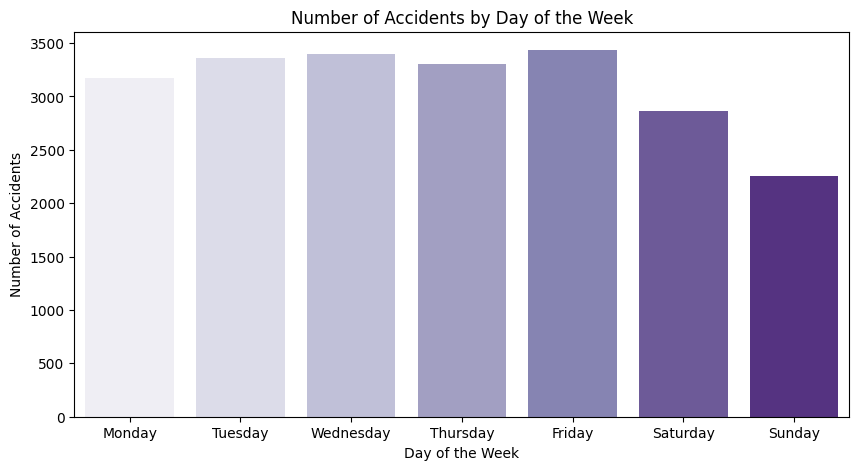

In [ ]:
# Plot accidents by day of the week
plt.figure(figsize=(10, 5))
sns.countplot(x='Day_of_Week', data=df,hue='Day_of_Week',palette='Purples')
plt.title('Number of Accidents by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')
plt.show()


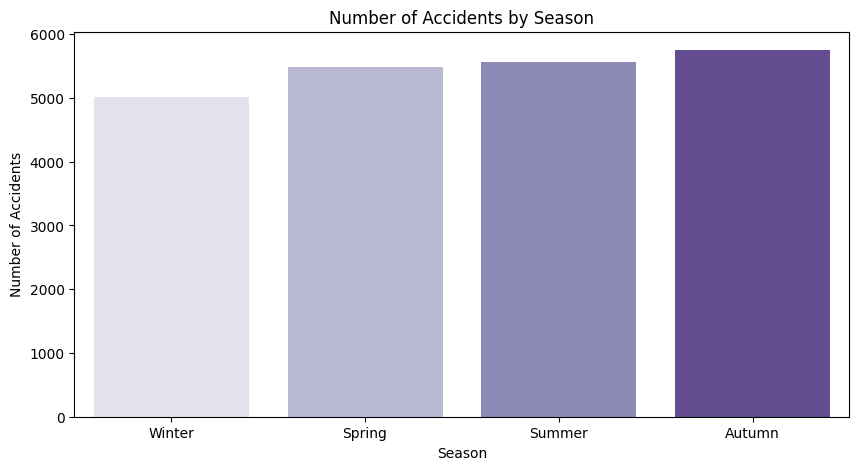

In [ ]:

# Plot accidents by season
plt.figure(figsize=(10, 5))
sns.countplot(x='Season', data=df, hue='Season',palette='Purples', order=['Winter', 'Spring', 'Summer', 'Autumn'])
plt.title('Number of Accidents by Season')
plt.xlabel('Season')
plt.ylabel('Number of Accidents')
plt.show()

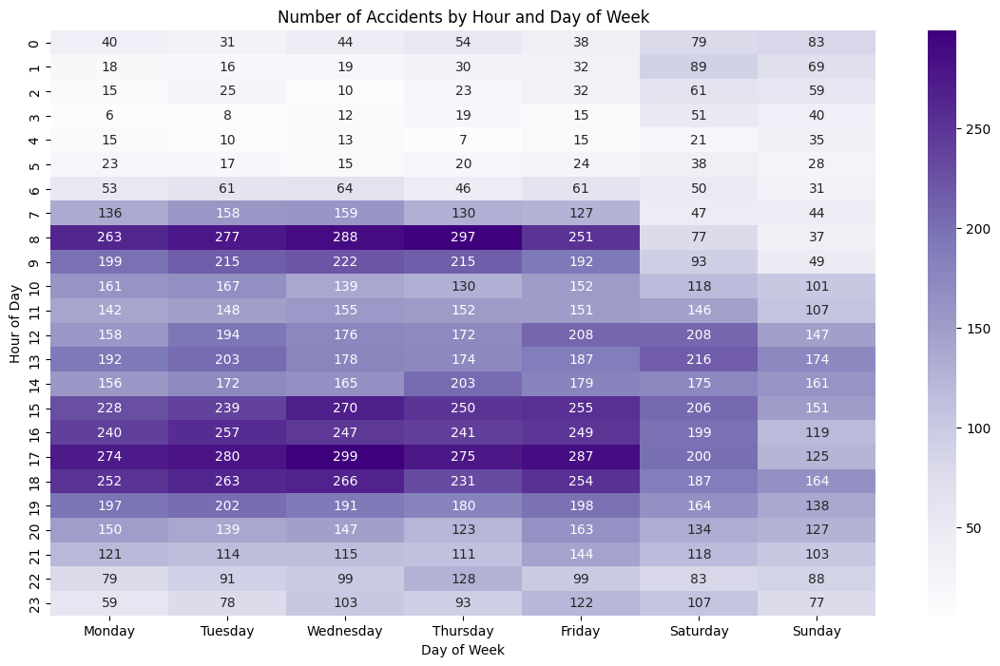

In [ ]:
# Create a pivot table to summarize the number of accidents by Hour and Day of Week
pivot_table = df.pivot_table(index='Hour', columns='Day_of_Week', aggfunc='size', fill_value=0)

# Plot the heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(pivot_table, cmap='Purples', annot=True, fmt='d')
plt.title('Number of Accidents by Hour and Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Hour of Day')
plt.show()

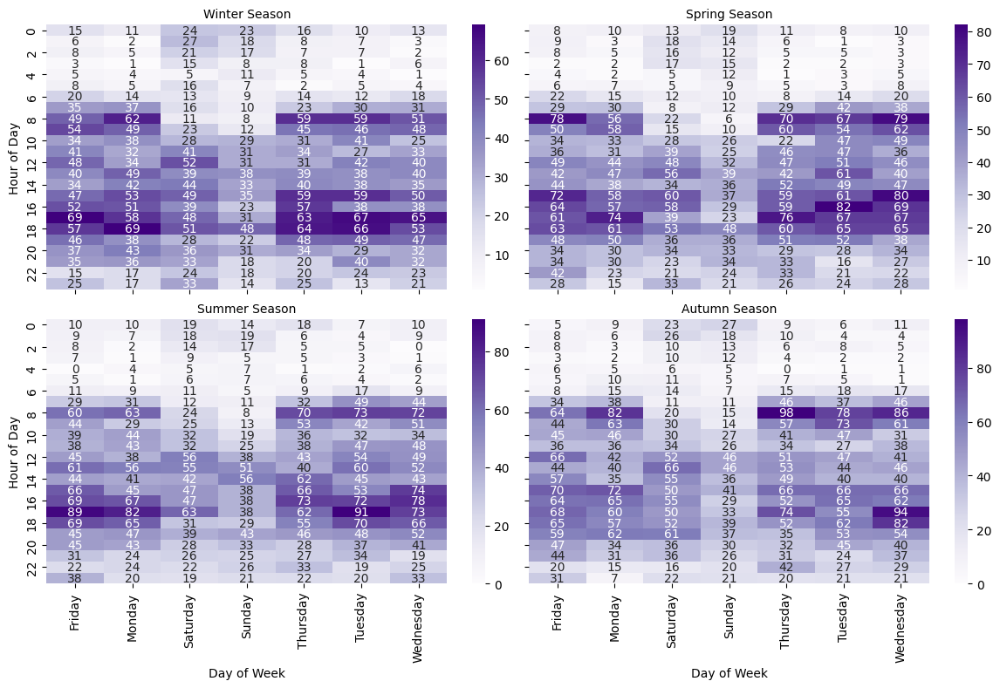

In [ ]:
# Create a pivot table to summarize the number of accidents by Hour and Day of Weekfor each Season
pivot_table2 = df.pivot_table(index='Hour', columns=['Day_of_Week', 'Season'], aggfunc='size', fill_value=0)

# Function to plot a heatmap for each season
def plot_heatmap(data, **kws):
    data = data.pivot(index='Hour', columns='Day_of_Week', values='Count')
    sns.heatmap(data, cmap='Purples', cbar=True, annot=True, fmt='d', **kws)

# Reset the pivot table and melt for facet grid plotting
pivot_table_reset = pivot_table2.reset_index()
pivot_table_melted = pivot_table_reset.melt(id_vars=['Hour'], var_name=['Day_of_Week', 'Season'], value_name='Count')

# Plot the facet grid of heatmaps
g = sns.FacetGrid(pivot_table_melted, col='Season', col_wrap=2, height=4, aspect=1.5)
g.map_dataframe(plot_heatmap)

# Adjust the layout and show the plot
g.set_axis_labels("Day of Week", "Hour of Day")
g.set_titles(col_template="{col_name} Season")
plt.show()

#### Geospatial  Analysis : Hotspots & Road Conditions

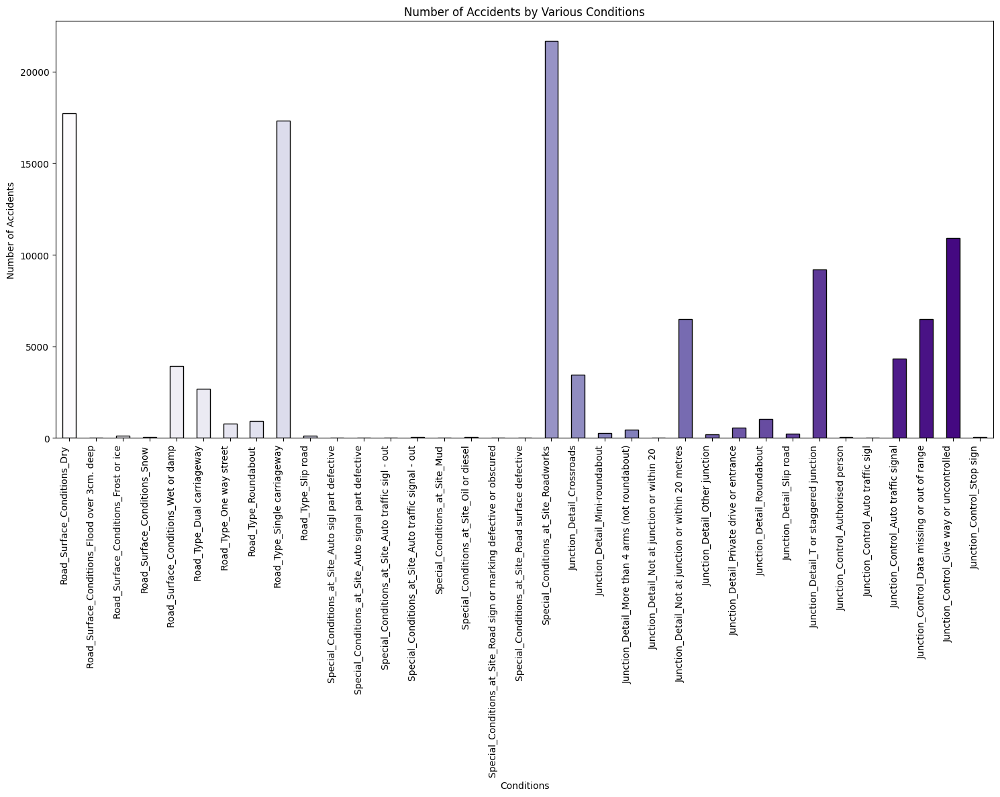

In [ ]:
# Number of Accidents by Road Condition

# Convert the specified columns to dummy variables
dummy_df = pd.get_dummies(df[['Road_Surface_Conditions','Road_Type','Special_Conditions_at_Site','Junction_Detail','Junction_Control']])

# Sum the dummy variables across rows
accident_counts = dummy_df.sum()

# Generate a list of colors from the Purples colormap
cmap = plt.get_cmap('Purples', len(accident_counts))  # Get colormap
colors = cmap(np.linspace(0, 1, len(accident_counts)))  # Generate colors

# Plotting
plt.figure(figsize=(15, 12))
accident_counts.plot(kind='bar', color=colors, edgecolor='black')
plt.xlabel('Conditions')
plt.ylabel('Number of Accidents')
plt.title('Number of Accidents by Various Conditions')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
#Generate a map with CircleMarkers for accident locations, colored by severity.

mean_lat = df['Latitude'].mean()
mean_lon = df['Longitude'].mean()

def create_accident_map_with_colors(df):
    m = folium.Map(location=[mean_lat, mean_lon], width="100%", height="100%", zoom_start=4)

    # color scheme for different severity levels
    severity_colors = {
        'Slight': 'green',
        'Serious': 'orange',
        'Fatal': 'red',
    }

    for index, row in df.iterrows():
        lat = row['Latitude']
        lon = row['Longitude']
        severity = row['Accident_Severity']

        if not pd.isnull(lat) and not pd.isnull(lon) and severity in severity_colors:
            # Get color based on severity
            color = severity_colors[severity]

            folium.CircleMarker(
                location=[lat, lon],
                radius=1,
                color=color,
                fill=True,
                fill_color=color,
                fill_opacity=0.6
            ).add_to(m)
    return m

create_accident_map_with_colors(df)

In [ ]:
#Geospatial Heatmap

# Create a base map
map = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=6)

# Create a heatmap layer
heat_data = [[row['Latitude'], row['Longitude']] for index, row in df.iterrows()]
HeatMap(heat_data).add_to(map)

# Display the map
map


#### Weather Conditions Analysis

In [ ]:
df['Weather_Conditions'].unique()

array(['Raining no high winds', 'Fine no high winds',
       'Snowing no high winds', 'Other', 'Fine + high winds',
       'Raining + high winds', 'Fog or mist', 'Snowing + high winds'],
      dtype=object)

In [ ]:
#Create a cross-tabulation showing the frequency of unique values in the Weather_Conditions column
t1=pd.crosstab(df["Weather_Conditions"], "freq")
t1

col_0,freq
Weather_Conditions,
Fine + high winds,49
Fine no high winds,19089
Fog or mist,47
Other,177
Raining + high winds,26
Raining no high winds,2282
Snowing + high winds,6
Snowing no high winds,125


array([<Axes: ylabel='freq'>], dtype=object)

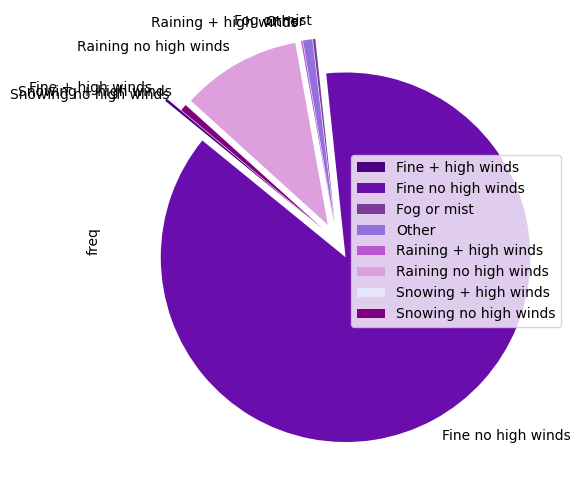

In [ ]:
#Pie chart to visualize the distribution of values in the Weather_Conditions column
colors = ['#4B0082', '#6A0DAD', '#7D3C98', '#9370DB', '#BA55D3', '#DDA0DD', '#E6E6FA', '#800080']
explode = [0.2, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1,0.1]
t1.plot.pie(subplots=True, figsize = (6, 6), colors=colors,
                 startangle=140, legend=True, explode=explode)

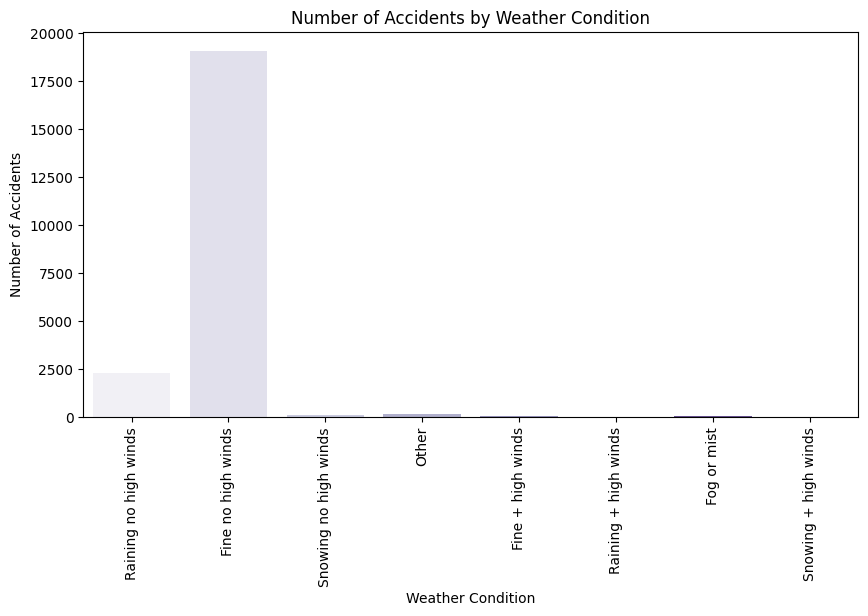

In [ ]:
# Plot accidents by weather condition
plt.figure(figsize=(10, 5))
sns.countplot(x='Weather_Conditions', data=df,hue='Weather_Conditions', palette='Purples')
plt.title('Number of Accidents by Weather Condition')
plt.xlabel('Weather Condition')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=90)
plt.show()


#### Accident Severity Analysis

In [ ]:
#Identifying unique values in the “Accident_Severity” column
labels=df["Accident_Severity"].unique()
labels

array(['Serious', 'Slight', 'Fatal'], dtype=object)

<ipython-input-36-75e8ee31c7cb>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = "Accident_Severity", data = df,palette=colors)


<Axes: xlabel='Accident_Severity', ylabel='count'>

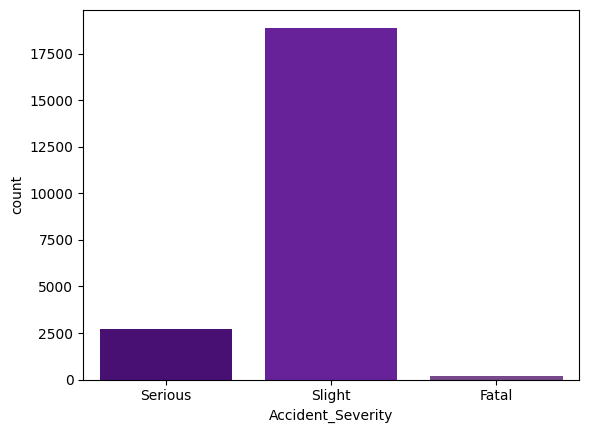

In [ ]:
#Create a bar chart and visualize the frequencies of unique values in the "Accident_Severity" column
colors = ['#4B0082', '#6A0DAD', '#7D3C98']
sns.countplot(x = "Accident_Severity", data = df,palette=colors)

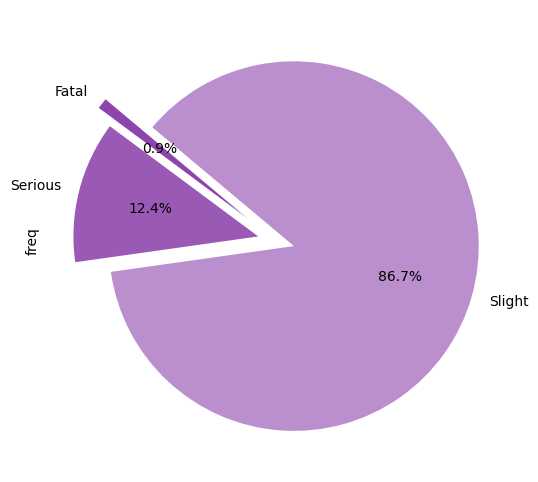

In [ ]:
# Create a crosstab
t = pd.crosstab(df["Accident_Severity"], "freq")

# Define colors and explode values
colors = ['#8e44ad', '#9b59b6', '#bb8fce']
explode = [0.2, 0.1, 0.1]  # Adjust explode values to separate slices

# Plot pie chart
ax = t.plot.pie(subplots=True, figsize=(6, 6), colors=colors, autopct='%1.1f%%',
                 startangle=140, legend=False, explode=explode)
plt.show()

<Axes: xlabel='Accident_Severity'>

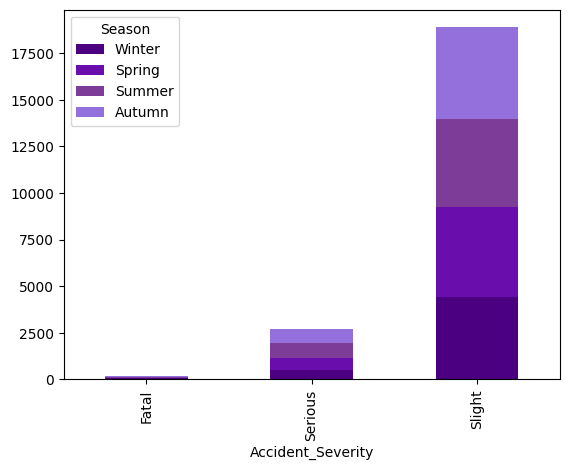

In [ ]:
colors = ['#4B0082', '#6A0DAD', '#7D3C98', '#9370DB']
t2=pd.crosstab(df['Accident_Severity'], df['Season'])
t2.plot.bar(stacked=True,color=colors)

##### Accident Severity VS Weather conditions


<center><b><i>Hypothesis 1</i></b></center>





<center>
    <b>Null Hypothesis (H0)</b> :
There is no correlation between weather conditions and accident severity</center>







<center><b>Alternative Hypothesis (H1)</b> :
There is a significant correlation between weather conditions and accident severity.</center>

In [ ]:
t3=pd.crosstab(df['Weather_Conditions'], df['Accident_Severity'])
t3

Accident_Severity,Fatal,Serious,Slight
Weather_Conditions,,,
Fine + high winds,1,4,44
Fine no high winds,180,2372,16537
Fog or mist,0,9,38
Other,3,24,150
Raining + high winds,0,6,20
Raining no high winds,21,276,1985
Snowing + high winds,0,1,5
Snowing no high winds,0,11,114


In [ ]:
stats.chi2_contingency(t3)

Chi2ContingencyResult(statistic=11.160001648068256, pvalue=0.6734233026621976, dof=14, expected_freq=array([[4.60758681e-01, 6.07527178e+00, 4.24639695e+01],
       [1.79498418e+02, 2.36675230e+03, 1.65427493e+04],
       [4.41952204e-01, 5.82730150e+00, 4.07307463e+01],
       [1.66437319e+00, 2.19453695e+01, 1.53390257e+02],
       [2.44484198e-01, 3.22361360e+00, 2.25319022e+01],
       [2.14581900e+01, 2.82934086e+02, 1.97760772e+03],
       [5.64194303e-02, 7.43910830e-01, 5.19966974e+00],
       [1.17540480e+00, 1.54981423e+01, 1.08326453e+02]]))

=> Given the p-value of 0.67 which is greater than the significance level of 0.05, we accept the null hypothesis. This indicates that there isno a significant association between the two categorical variables being tested.

<Axes: xlabel='Weather_Conditions'>

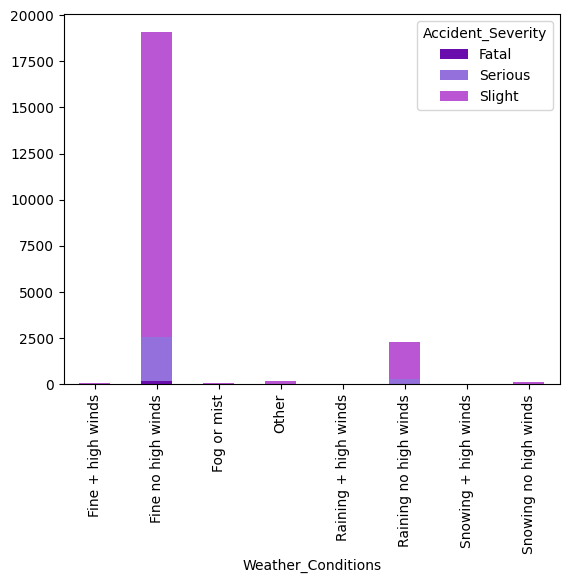

In [ ]:
#Stacked Bar chart for Accident severity distribution by Weather conditions
custom_palette = ['#6a0dad', '#9370db', '#ba55d3']
t3.plot.bar(stacked=True, color=custom_palette)

array([<Axes: ylabel='Fatal'>, <Axes: ylabel='Serious'>,
       <Axes: ylabel='Slight'>], dtype=object)

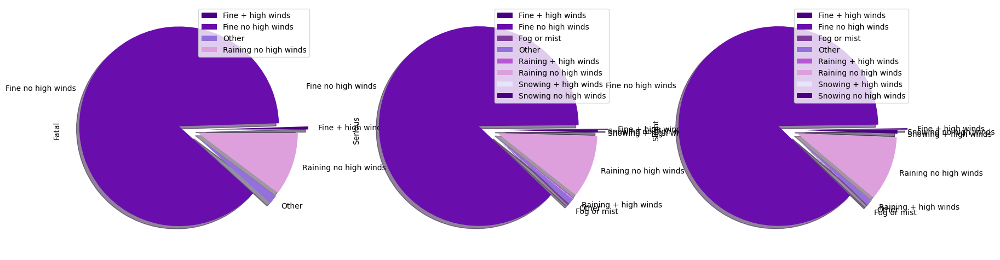

In [ ]:
#Pie chart for Accident severity distribution by Weather conditions
explode = [0.2, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1,0.1]
custom_palette = ['#4B0082', '#6A0DAD', '#7D3C98', '#9370DB', '#BA55D3', '#DDA0DD', '#E6E6FA']
t3.plot.pie(subplots=True, colors=custom_palette,figsize = (20, 20) ,explode=explode,shadow = True)

##### Accident Severity VS Time

In [ ]:
t4 = pd.crosstab(df['Accident_Severity'], df['Hour'])
t4


Hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
Accident_Severity,,,,,,,,,,,,,,,,,,,,,
Fatal,11,9,6,1,4,4,5,7,7,9,...,4,10,8,18,17,9,10,11,12,6
Serious,62,42,47,33,19,19,61,104,163,127,...,128,176,183,200,206,150,147,131,106,113
Slight,296,222,172,117,93,142,300,690,1320,1049,...,1079,1413,1361,1522,1394,1111,826,684,549,520


In [ ]:
# Initialize the LabelEncoder
label_encoder = LabelEncoder()
# Fit and transform the column
df['Accident_Severity_Num'] = label_encoder.fit_transform(df['Accident_Severity'])

In [ ]:
pearsonr(df['Accident_Severity_Num'], df['Hour'])

PearsonRResult(statistic=0.0030080659202998223, pvalue=0.6569548620712974)

=>A p-value of 0.2800 is greater than the common threshold of 0.05, indicating that the correlation is not statistically significant. This means that the observed weak correlation between hour and accident severity is likely due to random chance, and there isn't strong evidence to suggest a meaningful linear relationship.

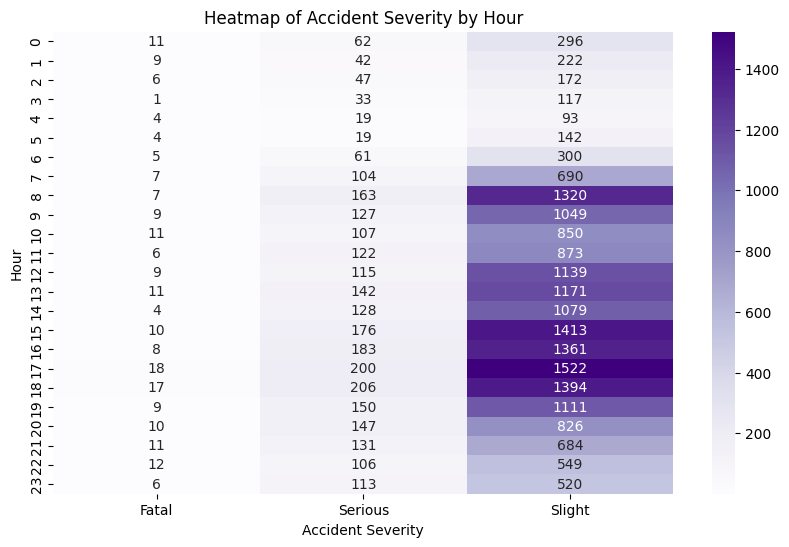

In [ ]:
# Create a contingency table
contingency_table = pd.crosstab(df['Hour'], df['Accident_Severity'])

# Plotting
plt.figure(figsize=(10, 6))
sns.heatmap(contingency_table, annot=True, cmap='Purples', fmt='d')
plt.title('Heatmap of Accident Severity by Hour')
plt.xlabel('Accident Severity')
plt.ylabel('Hour')
plt.show()

##### Accident Severity VS Day of the week

<center><b><i>Hypothesis 3</i></b></center>

<center>
    <b>Null Hypothesis (H0)</b> :
There is no correlation between Accident Severity and Day of Week</center>

<center><b>Alternative Hypothesis (H1)</b> :
There is a significant correlation between Accident Severity and Day of Week.</center>


In [ ]:
t5=pd.crosstab(df['Day_of_Week'],df['Accident_Severity'])
t5

Accident_Severity,Fatal,Serious,Slight
Day_of_Week,,,
Monday,22,371,2784
Tuesday,25,380,2960
Wednesday,36,406,2954
Thursday,38,406,2860
Friday,31,456,2948
Saturday,27,395,2445
Sunday,26,289,1942


In [ ]:
stats.chi2_contingency(t5)

Chi2ContingencyResult(statistic=20.765274432275373, pvalue=0.05392511527376627, dof=12, expected_freq=array([[  29.87408834,  393.90078437, 2753.22512729],
       [  31.64189716,  417.20999037, 2916.14811247],
       [  31.93339755,  421.05352965, 2943.01307279],
       [  31.06829962,  409.64689693, 2863.28480345],
       [  32.30012385,  425.88895005, 2976.8109261 ],
       [  26.95908445,  355.4653915 , 2484.57552406],
       [  21.22310903,  279.83445713, 1955.94243383]]))

=>Given the extremely low p-value, we reject the null hypothesis. This indicates a statistically significant association between accident severity and the day of the week.

<Axes: xlabel='Day_of_Week'>

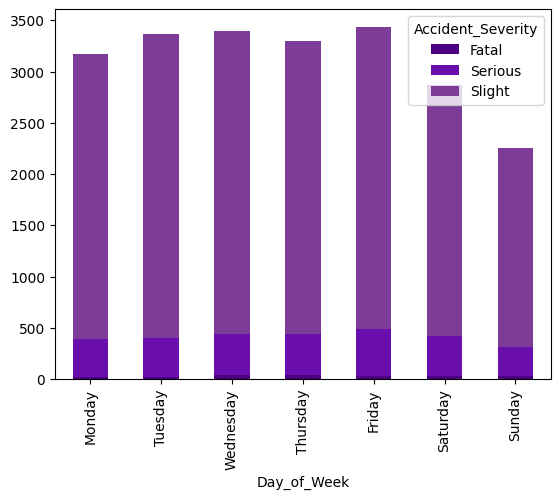

In [ ]:
custom_palette = ['#4B0082', '#6A0DAD', '#7D3C98']
t5.plot.bar(stacked=True,color=custom_palette)

##### Accident Severity VS Season

<center><b><i>Hypothesis 4</i></b></center>

<center>
    <b>Null Hypothesis (H0)</b> :
There is no correlation between Accident Severity and Season</center>

<center><b>Alternative Hypothesis (H1)</b> :
There is a significant correlation between Accident Severity and Season.</center>


In [ ]:
t6=pd.crosstab(df['Season'],df['Accident_Severity'])
t6

Accident_Severity,Fatal,Serious,Slight
Season,,,
Winter,45,526,4435
Spring,40,603,4839
Summer,55,817,4691
Autumn,65,757,4928


In [ ]:
stats.chi2_contingency(t6)

Chi2ContingencyResult(statistic=62.236344505098515, pvalue=1.5792175097144204e-11, dof=6, expected_freq=array([[  47.07261135,  620.66960231, 4338.25778634],
       [  51.54855282,  679.68652814, 4750.76491904],
       [  52.31021513,  689.72932434, 4820.96046053],
       [  54.06862071,  712.9145452 , 4983.01683409]]))

=>Given the extremely low p-value (1.579e-11), we reject the null hypothesis. This indicates a statistically significant association between accident severity and the season.

<Axes: xlabel='Season'>

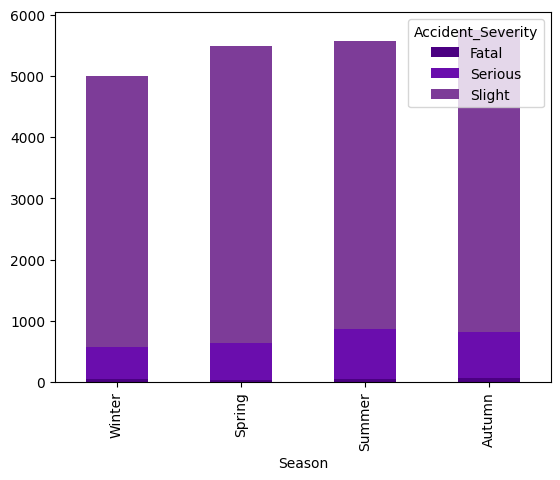

In [ ]:
custom_palette = ['#4B0082', '#6A0DAD', '#7D3C98']
t6.plot.bar(stacked=True,color=custom_palette)